## librosa


In [ ]:
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt
import librosa
import scipy.io.wavfile as wavf
import librosa.display
import IPython

In [ ]:
y, sr = librosa.load('1.wav')


# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

In [ ]:
sr

22050

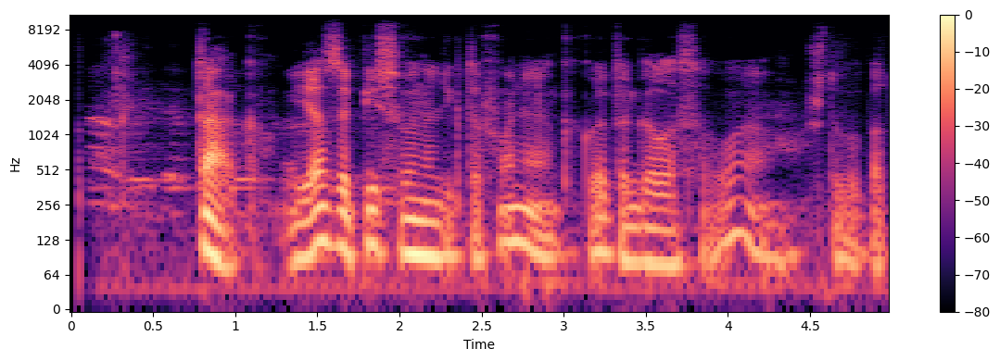

In [ ]:
idx = slice(*librosa.time_to_frames([0, 5], sr=sr))
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

In [ ]:
S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))

# The output of the filter shouldn't be greater than the input
# if we assume signals are additive. Taking the pointwise minimium
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter)

In [ ]:
margin_i, margin_v = 2, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

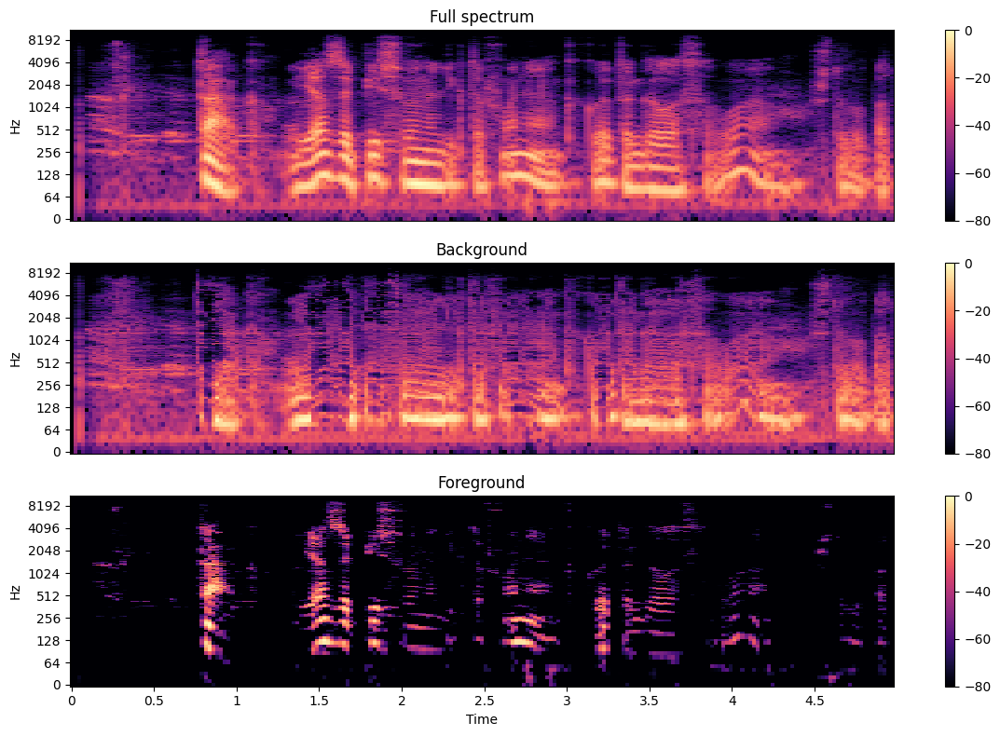

In [ ]:
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full[:, idx], ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background[:, idx], ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground[:, idx], ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [ ]:
S_foreground

array([[0.00000000e+00, 1.15547664e-04, 0.00000000e+00, ...,
        1.45061574e-06, 5.22955706e-05, 1.68875686e-03],
       [0.00000000e+00, 1.08664593e-04, 3.90451029e-03, ...,
        2.52340687e-03, 5.18263457e-03, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 5.11258468e-03, ...,
        2.83718249e-03, 6.28537236e-05, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        4.05472933e-10, 3.75299896e-05, 9.07014692e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        6.52624843e-09, 3.73787407e-05, 9.06705245e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.68363243e-08, 3.74923657e-05, 9.06604182e-05]], dtype=float32)

In [ ]:
wavf.write('f.wav', 16000, S_foreground)

In [ ]:
wavf.write('1new.wav', 22050, S_full)

In [ ]:
IPython.display.Audio(data='1.wav', rate=22050)

In [ ]:
IPython.display.Audio(data='1new.wav', rate=22050)

## NSNET2


In [ ]:
!pip install nsnet2-denoiser

In [ ]:
!pip install pydub

In [ ]:
from nsnet2_denoiser import NSnet2Enhancer


# numpy
import soundfile as sf
sigIn, fs = sf.read("1.wav")

enhancer = NSnet2Enhancer(fs=fs)

outSig = enhancer(sigIn, fs)

# pcm_16le
from pydub import AudioSegment
audioIn = AudioSegment.from_wav("1.wav")
audioOut = enhancer.pcm_16le

In [ ]:
with open('myfile.wav', mode='bx') as f:
    f.write(audioOut)

In [ ]:
type(audioOut)

bytes

In [ ]:
audioIn

In [ ]:
IPython.display.Audio(data='myfile.wav', rate=22050)

In [ ]:
IPython.display.Audio(data='1_site.mp3')

## py-intelligibility (pywstmi, pystgi)


In [ ]:

# -*- coding: utf-8 -*-
"""
Created on Thu Sep  8 11:14:21 2022

@author: Amin Edraki

Separated spectro-temporal modulation Gabor filter bank for wstmi.
This script extracts the separable spectro-temporal modulation
represntation from a log Mel-spectrogram as described in [1, 2].
Modified from the reference [1, 3] implementation.

[1] Schädler, M. R., & Kollmeier, B. (2015). Separable spectro-temporal
Gabor filter bank features: Reducing the complexity of robust features
for automatic speech recognition. The Journal of the Acoustical
Society of America, 137(4), 2047-2059.
[2] Edraki, A., Chan, W. Y., Jensen, J., & Fogerty, D. (2020).
Speech Intelligibility Prediction Using Spectro-Temporal Modulation
Analysis. IEEE/ACM Transactions on Audio, Speech, and Language
Processing, 29, 210-225.
[3] Schädler, M. R., Meyer, B. T., & Kollmeier, B. (2012).
Spectro-temporal modulation subspace-spanning filter bank features
for robust automatic speech recognition. The Journal of the Acoustical
Society of America, 131(5), 4134-4151.

"""

import numpy as np


def hann_win(width):
    x_center = 0.5
    step = 1/width
    right = np.arange(x_center, 1+step, step=step)
    left  = np.arange(x_center, 0-step, step=-step)

    x_values = np.transpose(np.concatenate((np.flip(left, axis=0), right[1:]), axis=0))
    valid_values_mask = (x_values > 0) & (x_values < 1)
    valid_values_mask[0] = False
    valid_values_mask[-1] = False
    window_function = 0.5 * (1 - (np.cos(2*np.pi*x_values[valid_values_mask])))

    return window_function


def gfilter_gen(omega, nu, phi, size_max):
    w = np.Inf;
    if omega > 0:
        w = 2*np.pi / abs(omega) * nu / 2

    if w > size_max:
        w = size_max
        omega = 0

    envelope = hann_win(w)
    win_size = envelope.size
    x_0 = (win_size+1) / 2
    x = np.arange(1, win_size+1, 1)
    sinusoid = np.exp(1j * (omega*(x - x_0) + phi))
    gfilter  = np.real(envelope * sinusoid)
    envelope_mean = np.mean(envelope)
    gfilter_mean = np.mean(gfilter)

    if omega != 0:
        gfilter = gfilter - envelope/envelope_mean * gfilter_mean

    gfilter = gfilter / max(abs(np.fft.fft(gfilter)))
    return gfilter


def gbfb1d(X, size_max, nu, phase, omega):
    out = []
    for i in range(omega.size):
        gfilter = gfilter_gen(omega[i], nu, phase, size_max)
        in_filtered = np.apply_along_axis(lambda m: np.convolve(m, gfilter, mode='full'), axis=0, arr=X)

        M = gfilter.size
        N = X.shape[0]
        idx = int(np.floor((M - 1)/2))
        in_filtered = in_filtered[idx:idx+N]
        out.append(in_filtered)
    return out


def gbfb_axis(omega_max, size_max, nu, distance):
    omega_min = (np.pi * nu) / size_max;
    c = distance * 8 / nu;
    space = (1 + c/2) / (1 - c/2);
    omega = [];
    count = 0
    last_omega = omega_max

    while last_omega/space > omega_min:
        omega.append(omega_max/(space**count))
        count = count + 1
        last_omega = omega[-1]

    omega = np.flip(omega)
    omega = np.insert(omega, 0, 0)
    return omega


def sgbfb(log_mel_spec, stm_channels=np.ones((11, 5)), omega_s=None, omega_t=None):
    omega_max = np.array([2*np.pi/3, np.pi/2])
    num_bands = log_mel_spec.shape[0]
    nu = [3.5, 3.5]
    size_max = [3*num_bands, 40]
    phases = [0, 0];
    distance = [0.2, 0.2];
    context = int(np.floor(size_max[1]/2))

    if omega_s is None and omega_t is None:
        row, col = np.nonzero(stm_channels)
        row = np.unique(row)
        col = np.unique(col)
        omega_s = gbfb_axis(omega_max[0], size_max[0], nu[0], distance[0])
        omega_t = gbfb_axis(omega_max[1], size_max[1], nu[1], distance[1])
        omega_s = omega_s[row];
        omega_t = omega_t[col];


    left_context = np.repeat(np.expand_dims(log_mel_spec[:, 0], axis=1), repeats=context, axis=1)
    right_context = np.repeat(np.expand_dims(log_mel_spec[:, -1], axis=1), repeats=context, axis=1)

    log_mel_spec = np.concatenate((left_context, log_mel_spec, right_context), axis=1)

    features_spec = gbfb1d(log_mel_spec, size_max[0], nu[0], phases[0], omega_s)
    features_spec = np.concatenate(features_spec, axis=0)
    features_spec = gbfb1d(np.transpose(features_spec), size_max[1], nu[1], phases[1], omega_t)
    features_spec = np.concatenate(features_spec, axis=0)
    features_spec = np.transpose(features_spec)

    time_frames   = int(log_mel_spec.shape[1])
    freq_bins     = int(log_mel_spec.shape[0])

    STM_dec       = np.zeros((omega_s.size, omega_t.size, freq_bins, time_frames-2*context))
    for s in range(omega_s.size):
        for r in range(omega_t.size):
            filtered_spec = features_spec[s*freq_bins:(s+1)*freq_bins, r*time_frames:(r+1)*time_frames]
            STM_dec[s, r, ...] = filtered_spec[:, context:-context]

    return STM_dec



def log_mel_spectrogram(signal, fs, win_shift=10, win_length=25, freq_range=None, num_bands=130, band_factor=1):
    signal = np.squeeze(signal)
    assert signal.ndim == 1
    if freq_range is None:
        freq_range = [64.0, min(np.floor(fs/2), 12000)]

    M = round(win_shift/1000*fs)
    N = round(win_length/1000*fs)
    num_coeff = 1024


    num_frames = int(1 + np.floor((len(signal) - N) / M))




    frames = np.zeros((N, num_frames))
    for i in range(num_frames):
        frames[:, i] = signal[i*M:(i*M+N)]


    window_function = np.hamming(N)
    window_function = window_function / np.sqrt(np.mean(window_function**2))
    window_function = np.expand_dims(window_function, axis=1)
    signal_frame = frames*window_function


    spec = (1/num_coeff) * abs(np.fft.fft(signal_frame, num_coeff, axis=0))
    freq_centers = mel2hz(np.linspace(hz2mel(freq_range[0]), hz2mel(freq_range[1]), (num_bands+1)*band_factor+1))
    mel_spec, _ = triafbmat(fs, num_coeff, freq_centers, [1, 1]*band_factor)



    mel_spec = np.matmul(mel_spec, spec)


    freq_centers = freq_centers[band_factor:-band_factor]
    log_mel_spec = np.maximum(-20, np.minimum(0, 20*np.log10(np.maximum(mel_spec, 0))) + 130)
    return log_mel_spec, freq_centers









def triafbmat(fs, num_coeff, freq_centers, width):
    width_left = width[0]
    width_right = width[1]
    freq_centers_idx = np.round(freq_centers/fs * num_coeff) - 1
    num_bands = len(freq_centers)-(width_left+width_right)
    transmat = np.zeros((num_bands, num_coeff))
    for i in range(num_bands):
        left = int(freq_centers_idx[i])
        center = int(freq_centers_idx[i+width_left])
        right = int(freq_centers_idx[i+width_left+width_right])
        start_raise = 0
        stop_raise = 1
        start_fall = 1
        stop_fall = 0
        if left >= 1:
            transmat[i, left:center+1] = np.linspace(start_raise, stop_raise, center-left+1)

        if right <= num_coeff:
            transmat[i, center:right+1] = np.linspace(start_fall, stop_fall, right-center+1)


    return transmat, freq_centers_idx


def mel2hz(m):
    f = 700*((10.**(m/2595))-1)
    return f

def hz2mel(f):
    m = 2595*np.log10(1+f/700)
    return m




In [ ]:
import numpy as np


def pystgi(clean_speech, degraded_speech, Fs):
    """
    Implementation of the Spectro-Temporal Glimpsing Index (STGI)
    predictor, described in [1].

    Parameters
    ----------
    clean_speech : numpy array - float
        clean reference time domain signal.
    degraded_speech : numpy array - float
        noisy/processed time domain signal.
    Fs : float/int
        sampling frequency in Hz.

    Returns
    -------
    rho : float
        intelligibility index.


    References:
    [1] A. Edraki, W.-Y. Chan, J. Jensen, & D. Fogerty,
    “A Spectro-Temporal Glimpsing Index (STGI) for Speech Intelligibility Prediction,"
    Proc. Interspeech, 5 pages, Aug 2021.
    """
    assert clean_speech.size == degraded_speech.size
    assert Fs == 10000
    STM_channels = np.ones((11, 4))
    thresholds   = [[0.252,0.347,0.275,0.189],
                    [0.502,0.495,0.404,0.279],
                    [0.486,0.444,0.357,0.247],
                    [0.456,0.405,0.332,0.229],
                    [0.426,0.361,0.287,0.191],
                    [0.357,0.299,0.229,0.150],
                    [0.269,0.228,0.175,0.114],
                    [0.185,0.158,0.118,0.075],
                    [0.119,0.103,0.073,0.047],
                    [0.081,0.067,0.047,0.030],
                    [0.050,0.043,0.031,0.020]]

    win_length  = 25.6
    win_shift   = win_length/2
    freq_range  = [64, min(np.floor(Fs/2), 12000)]
    num_bands   = 130
    band_factor = 1
    N           = 40
    eps = 1e-15

    X, _    = log_mel_spectrogram(clean_speech, fs=Fs, win_shift=win_shift, win_length=win_length, freq_range=freq_range, num_bands=num_bands, band_factor=band_factor)
    Y, _    = log_mel_spectrogram(degraded_speech, fs=Fs, win_shift=win_shift, win_length=win_length, freq_range=freq_range, num_bands=num_bands, band_factor=band_factor)

    X_hat     = sgbfb(X, STM_channels)
    Y_hat     = sgbfb(Y, STM_channels)

    intell    = np.zeros((X_hat.shape[3] - N + 1,))


    for n in range(N-1, X_hat.shape[3]):
        X_seg = X_hat[..., (n-N+1):n+1]
        Y_seg = Y_hat[..., (n-N+1):n+1]

        X_seg = X_seg + eps*np.random.rand(*X_seg.shape)
        Y_seg = Y_seg + eps*np.random.rand(*Y_seg.shape)

        X_seg = X_seg - np.expand_dims(np.mean(X_seg, axis=3), axis=3)
        Y_seg = Y_seg - np.expand_dims(np.mean(Y_seg, axis=3), axis=3)
        X_seg = X_seg / np.expand_dims(np.sqrt(np.sum(X_seg*X_seg, axis=3)), axis=3)
        Y_seg = Y_seg / np.expand_dims(np.sqrt(np.sum(Y_seg*Y_seg, axis=3)), axis=3)

        X_seg = X_seg - np.expand_dims(np.mean(X_seg, axis=2), axis=2)
        Y_seg = Y_seg - np.expand_dims(np.mean(Y_seg, axis=2), axis=2)
        X_seg = X_seg / np.expand_dims(np.sqrt(np.sum(X_seg*X_seg, axis=2)), axis=2)
        Y_seg = Y_seg / np.expand_dims(np.sqrt(np.sum(Y_seg*Y_seg, axis=2)), axis=2)

        d = np.squeeze(np.sum(X_seg * Y_seg, axis=2));
        d = np.squeeze(np.mean(d, axis=2));
        g = d > thresholds
        intell[n-N+1] = np.mean(g[:])

    rho = np.mean(intell[:])
    return rho

In [ ]:
noisy, sr = librosa.load('1.wav', sr=10000)
clean, sr = librosa.load('1_site.wav', sr=10000)

In [ ]:
d = pystgi(clean, noisy, sr)

In [ ]:
d

0.9854560750522613

## Noise reduction using spectral gating in python



In [ ]:
import IPython
from scipy.io import wavfile
import scipy.signal
import numpy as np
import matplotlib.pyplot as plt
import librosa
%matplotlib inline

In [ ]:
def fftnoise(f):
    f = np.array(f, dtype="complex")
    Np = (len(f) - 1) // 2
    phases = np.random.rand(Np) * 2 * np.pi
    phases = np.cos(phases) + 1j * np.sin(phases)
    f[1 : Np + 1] *= phases
    f[-1 : -1 - Np : -1] = np.conj(f[1 : Np + 1])
    return np.fft.ifft(f).real


def band_limited_noise(min_freq, max_freq, samples=1024, samplerate=1):
    freqs = np.abs(np.fft.fftfreq(samples, 1 / samplerate))
    f = np.zeros(samples)
    f[np.logical_and(freqs >= min_freq, freqs <= max_freq)] = 1
    return fftnoise(f)

In [ ]:
import time
from datetime import timedelta as td


def _stft(y, n_fft, hop_length, win_length):
    return librosa.stft(y=y, n_fft=n_fft, hop_length=hop_length, win_length=win_length)


def _istft(y, hop_length, win_length):
    return librosa.istft(y, hop_length, win_length)


def _amp_to_db(x):
    return librosa.core.amplitude_to_db(x, ref=1.0, amin=1e-20, top_db=80.0)


def _db_to_amp(x,):
    return librosa.core.db_to_amplitude(x, ref=1.0)


def plot_spectrogram(signal, title):
    fig, ax = plt.subplots(figsize=(20, 4))
    cax = ax.matshow(
        signal,
        origin="lower",
        aspect="auto",
        cmap=plt.cm.seismic,
        vmin=-1 * np.max(np.abs(signal)),
        vmax=np.max(np.abs(signal)),
    )
    fig.colorbar(cax)
    ax.set_title(title)
    plt.tight_layout()
    plt.show()


def plot_statistics_and_filter(
    mean_freq_noise, std_freq_noise, noise_thresh, smoothing_filter
):
    fig, ax = plt.subplots(ncols=2, figsize=(20, 4))
    plt_mean, = ax[0].plot(mean_freq_noise, label="Mean power of noise")
    plt_std, = ax[0].plot(std_freq_noise, label="Std. power of noise")
    plt_std, = ax[0].plot(noise_thresh, label="Noise threshold (by frequency)")
    ax[0].set_title("Threshold for mask")
    ax[0].legend()
    cax = ax[1].matshow(smoothing_filter, origin="lower")
    fig.colorbar(cax)
    ax[1].set_title("Filter for smoothing Mask")
    plt.show()


def removeNoise(
    audio_clip,
    noise_clip,
    n_grad_freq=2,
    n_grad_time=4,
    n_fft=2048,
    win_length=2048,
    hop_length=512,
    n_std_thresh=1.5,
    prop_decrease=1.0,
    verbose=False,
    visual=False,
):
    """Remove noise from audio based upon a clip containing only noise

    Args:
        audio_clip (array): The first parameter.
        noise_clip (array): The second parameter.
        n_grad_freq (int): how many frequency channels to smooth over with the mask.
        n_grad_time (int): how many time channels to smooth over with the mask.
        n_fft (int): number audio of frames between STFT columns.
        win_length (int): Each frame of audio is windowed by `window()`. The window will be of length `win_length` and then padded with zeros to match `n_fft`..
        hop_length (int):number audio of frames between STFT columns.
        n_std_thresh (int): how many standard deviations louder than the mean dB of the noise (at each frequency level) to be considered signal
        prop_decrease (float): To what extent should you decrease noise (1 = all, 0 = none)
        visual (bool): Whether to plot the steps of the algorithm

    Returns:
        array: The recovered signal with noise subtracted

    """
    if verbose:
        start = time.time()
    # STFT over noise
    noise_stft = _stft(noise_clip, n_fft, hop_length, win_length)
    noise_stft_db = _amp_to_db(np.abs(noise_stft))  # convert to dB
    # Calculate statistics over noise
    mean_freq_noise = np.mean(noise_stft_db, axis=1)
    std_freq_noise = np.std(noise_stft_db, axis=1)
    noise_thresh = mean_freq_noise + std_freq_noise * n_std_thresh
    if verbose:
        print("STFT on noise:", td(seconds=time.time() - start))
        start = time.time()
    # STFT over signal
    if verbose:
        start = time.time()
    sig_stft = _stft(audio_clip, n_fft, hop_length, win_length)
    sig_stft_db = _amp_to_db(np.abs(sig_stft))
    if verbose:
        print("STFT on signal:", td(seconds=time.time() - start))
        start = time.time()
    # Calculate value to mask dB to
    mask_gain_dB = np.min(_amp_to_db(np.abs(sig_stft)))
    print(noise_thresh, mask_gain_dB)
    # Create a smoothing filter for the mask in time and frequency
    smoothing_filter = np.outer(
        np.concatenate(
            [
                np.linspace(0, 1, n_grad_freq + 1, endpoint=False),
                np.linspace(1, 0, n_grad_freq + 2),
            ]
        )[1:-1],
        np.concatenate(
            [
                np.linspace(0, 1, n_grad_time + 1, endpoint=False),
                np.linspace(1, 0, n_grad_time + 2),
            ]
        )[1:-1],
    )
    smoothing_filter = smoothing_filter / np.sum(smoothing_filter)
    # calculate the threshold for each frequency/time bin
    db_thresh = np.repeat(
        np.reshape(noise_thresh, [1, len(mean_freq_noise)]),
        np.shape(sig_stft_db)[1],
        axis=0,
    ).T
    # mask if the signal is above the threshold
    sig_mask = sig_stft_db < db_thresh
    if verbose:
        print("Masking:", td(seconds=time.time() - start))
        start = time.time()
    # convolve the mask with a smoothing filter
    sig_mask = scipy.signal.fftconvolve(sig_mask, smoothing_filter, mode="same")
    sig_mask = sig_mask * prop_decrease
    if verbose:
        print("Mask convolution:", td(seconds=time.time() - start))
        start = time.time()
    # mask the signal
    sig_stft_db_masked = (
        sig_stft_db * (1 - sig_mask)
        + np.ones(np.shape(mask_gain_dB)) * mask_gain_dB * sig_mask
    )  # mask real
    sig_imag_masked = np.imag(sig_stft) * (1 - sig_mask)
    sig_stft_amp = (_db_to_amp(sig_stft_db_masked) * np.sign(sig_stft)) + (
        1j * sig_imag_masked
    )
    if verbose:
        print("Mask application:", td(seconds=time.time() - start))
        start = time.time()
    # recover the signal
    recovered_signal = _istft(sig_stft_amp, hop_length, win_length)
    recovered_spec = _amp_to_db(
        np.abs(_stft(recovered_signal, n_fft, hop_length, win_length))
    )
    if verbose:
        print("Signal recovery:", td(seconds=time.time() - start))
    if visual:
        plot_spectrogram(noise_stft_db, title="Noise")
    if visual:
        plot_statistics_and_filter(
            mean_freq_noise, std_freq_noise, noise_thresh, smoothing_filter
        )
    if visual:
        plot_spectrogram(sig_stft_db, title="Signal")
    if visual:
        plot_spectrogram(sig_mask, title="Mask applied")
    if visual:
        plot_spectrogram(sig_stft_db_masked, title="Masked signal")
    if visual:
        plot_spectrogram(recovered_spec, title="Recovered spectrogram")
    return recovered_signal

In [ ]:
wav_loc = "1.wav"
src_rate, src_data = wavfile.read(wav_loc)
# src_data = np.concatenate((src_data, np.zeros(src_rate*3)))
src_data = src_data / 32768
#wav_loc = "assets/audio/cafe.wav"
#noise_rate, noise_data = wavfile.read(wav_loc)
# get some noise to add to the signal
noise_to_add = noise_data[len(src_data) : len(src_data) * 2]
# get a different part of the noise clip for calculating statistics
noise_clip = noise_data[: len(src_data)]
noise_clip = noise_clip / max(noise_to_add)
noise_to_add = noise_to_add / max(noise_to_add)
# apply noise
snr = 1  # signal to noise ratio
audio_clip_cafe = src_data# + noise_to_add / snr
noise_clip = noise_clip / snr

In [ ]:
output = removeNoise(
    audio_clip=audio_clip_cafe,
    noise_clip=noise_clip,
    n_std_thresh=2,
    prop_decrease=0.95,
    visual=True,
)

## PySTOI


In [ ]:
!pip install pystoi

In [ ]:
import soundfile as sf
from pystoi import stoi

clean, fs = sf.read('1_site.wav')
denoised, fs = sf.read('1.wav')


In [ ]:
clean.shape

(1120257, 2)

In [ ]:
clean = clean[:, 0]

In [ ]:
denoised.shape

(1120257,)

In [ ]:

# Clean and den should have the same length, and be 1D
d = stoi(clean, denoised, fs, extended=False)

In [ ]:
d

0.9615541545312697

## Speech Intelligibility Measures



In [ ]:
from scipy.io import wavfile
import sys
sys.path.append("../")

In [ ]:
import numpy as np
from scipy.signal import firls,kaiser,upfirdn
from fractions import Fraction

def extract_overlapped_windows(x,nperseg,noverlap,window=None):
    # source: https://github.com/scipy/scipy/blob/v1.2.1/scipy/signal/spectral.py
    step = nperseg - noverlap
    shape = x.shape[:-1]+((x.shape[-1]-noverlap)//step, nperseg)
    strides = x.strides[:-1]+(step*x.strides[-1], x.strides[-1])
    result = np.lib.stride_tricks.as_strided(x, shape=shape,
                                             strides=strides)
    if window is not None:
        result = window * result
    return result

def resample_matlab_like(x_orig,p,q):
    if len(x_orig.shape)>2:
        raise ValueError('x must be a vector or 2d matrix')

    if x_orig.shape[0]<x_orig.shape[1]:
        x=x_orig.T
    else:
        x= x_orig
    beta = 5
    N = 10
    frac=Fraction(p, q)
    p = frac.numerator
    q = frac.denominator
    pqmax = max(p,q)
    fc = 1/2/pqmax
    L = 2*N*pqmax + 1
    h = firls( L, np.array([0,2*fc,2*fc,1]), np.array([1,1,0,0]))*kaiser(L,beta)
    h = p*h/sum(h)

    Lhalf = (L-1)/2
    Lx = x.shape[0]

    nz = int(np.floor(q-np.mod(Lhalf,q)))
    z = np.zeros((nz,))
    h = np.concatenate((z,h))
    Lhalf = Lhalf + nz
    delay = int(np.floor(np.ceil(Lhalf)/q))
    nz1 = 0
    while np.ceil( ((Lx-1)*p+len(h)+nz1 )/q ) - delay < np.ceil(Lx*p/q):
        nz1 = nz1+1
    h = np.concatenate((h,np.zeros(nz1,)))
    y = upfirdn(h,x,p,q,axis=0)
    Ly = int(np.ceil(Lx*p/q))
    y = y[delay:]
    y = y[:Ly]

    if x_orig.shape[0]<x_orig.shape[1]:
        y=y.T

    return y

In [ ]:
from scipy.signal import stft,resample,butter,lfilter,hilbert
from scipy.interpolate import interp1d
from pystoi import stoi as pystoi # https://github.com/mpariente/pystoi
import numpy as np

stoi = pystoi

def fwseg_noise(clean_speech, processed_speech,fs,frameLen=0.03, overlap=0.75):

    clean_length = len(clean_speech)
    processed_length = len(processed_speech)
    rms_all=np.linalg.norm(clean_speech)/np.sqrt(processed_length)

    winlength   = round(frameLen*fs) #window length in samples
    skiprate    = int(np.floor((1-overlap)*frameLen*fs)) #window skip in samples
    max_freq    = fs/2 #maximum bandwidth
    num_crit    = 16 # number of critical bands
    n_fft       = int(2**np.ceil(np.log2(2*winlength)))
    n_fftby2    = int(n_fft/2)

    cent_freq=np.zeros((num_crit,))
    bandwidth=np.zeros((num_crit,))

    # ----------------------------------------------------------------------
    # Critical Band Filter Definitions (Center Frequency and Bandwidths in Hz)
    # ----------------------------------------------------------------------
    cent_freq[0]  = 150.0000;   bandwidth[0]   = 100.0000;
    cent_freq[1]  = 250.000;    bandwidth[1]  = 100.0000;
    cent_freq[2]  = 350.000;    bandwidth[2]  = 100.0000;
    cent_freq[3]  = 450.000;    bandwidth[3]  = 110.0000;
    cent_freq[4]  = 570.000;    bandwidth[4]  = 120.0000;
    cent_freq[5]  = 700.000;    bandwidth[5]  = 140.0000;
    cent_freq[6]  = 840.000;    bandwidth[6]  = 150.0000;
    cent_freq[7]  = 1000.000;   bandwidth[7]  = 160.000;
    cent_freq[8]  = 1170.000;   bandwidth[8]  = 190.000;
    cent_freq[9] = 1370.000;    bandwidth[9] = 210.000;
    cent_freq[10] = 1600.000;   bandwidth[10]= 240.000;
    cent_freq[11] = 1850.000;   bandwidth[11]= 280.000;
    cent_freq[12] = 2150.000;   bandwidth[12]= 320.000;
    cent_freq[13] = 2500.000;   bandwidth[13]= 380.000;
    cent_freq[14] = 2900.000;   bandwidth[14]= 450.000;
    cent_freq[15] = 3400.000;   bandwidth[15]= 550.000;

    Weight=np.array([0.0192,0.0312,0.0926,0.1031,0.0735,0.0611,0.0495,0.044,0.044,0.049,0.0486,0.0493, 0.049,0.0547,0.0555,0.0493])

    # ----------------------------------------------------------------------
    # Set up the critical band filters.  Note here that Gaussianly shaped
    # filters are used.  Also, the sum of the filter weights are equivalent
    # for each critical band filter.  Filter less than -30 dB and set to
    # zero.
    # ----------------------------------------------------------------------

    all_f0=np.zeros((num_crit,))
    crit_filter=np.zeros((num_crit,int(n_fftby2)))
    g = np.zeros((num_crit,n_fftby2))

    b = bandwidth;
    q = cent_freq/1000;
    p = 4*1000*q/b;        # Eq. (7)

    #15.625=4000/256
    j = np.arange(0,n_fftby2)

    for i in range(num_crit):
        g[i,:]=np.abs(1-j*(fs/n_fft)/(q[i]*1000));# Eq. (9)
        crit_filter[i,:] = (1+p[i]*g[i,:])*np.exp(-p[i]*g[i,:]);#  Eq. (8)

    num_frames = int(clean_length/skiprate-(winlength/skiprate)); # number of frames
    start      = 0 # starting sample
    hannWin = 0.5*(1-np.cos(2*np.pi*np.arange(1,winlength+1)/(winlength+1)))

    f,t,clean_spec=stft(clean_speech[0:int(num_frames)*skiprate+int(winlength-skiprate)], fs=fs, window=hannWin, nperseg=winlength, noverlap=winlength-skiprate, nfft=n_fft, detrend=False, return_onesided=False, boundary=None, padded=False)
    f,t,processed_spec=stft(processed_speech[0:int(num_frames)*skiprate+int(winlength-skiprate)], fs=fs, window=hannWin, nperseg=winlength, noverlap=winlength-skiprate, nfft=n_fft, detrend=False, return_onesided=False, boundary=None, padded=False)

    clean_frames = extract_overlapped_windows(clean_speech[0:int(num_frames)*skiprate+int(winlength-skiprate)],winlength,winlength-skiprate,None)
    rms_seg = np.linalg.norm(clean_frames,axis=-1)/np.sqrt(winlength);
    rms_db = 20*np.log10(rms_seg/rms_all);
    #--------------------------------------------------------------
    # cal r2_high,r2_middle,r2_low
    highInd = np.where(rms_db>=0)
    highInd = highInd[0]
    middleInd = np.where((rms_db>=-10) & (rms_db<0))
    middleInd = middleInd[0]
    lowInd = np.where(rms_db<-10)
    lowInd = lowInd[0]

    num_high = np.sum(clean_spec[0:n_fftby2,highInd]*np.conj(processed_spec[0:n_fftby2,highInd]),axis=-1)
    denx_high = np.sum(np.abs(clean_spec[0:n_fftby2,highInd])**2,axis=-1)
    deny_high = np.sum(np.abs(processed_spec[0:n_fftby2,highInd])**2,axis=-1);

    num_middle = np.sum(clean_spec[0:n_fftby2,middleInd]*np.conj(processed_spec[0:n_fftby2,middleInd]),axis=-1)
    denx_middle = np.sum(np.abs(clean_spec[0:n_fftby2,middleInd])**2,axis=-1)
    deny_middle = np.sum(np.abs(processed_spec[0:n_fftby2,middleInd])**2,axis=-1);

    num_low = np.sum(clean_spec[0:n_fftby2,lowInd]*np.conj(processed_spec[0:n_fftby2,lowInd]),axis=-1)
    denx_low = np.sum(np.abs(clean_spec[0:n_fftby2,lowInd])**2,axis=-1)
    deny_low = np.sum(np.abs(processed_spec[0:n_fftby2,lowInd])**2,axis=-1);

    num2_high = np.abs(num_high)**2;
    r2_high = num2_high/(denx_high*deny_high);

    num2_middle = np.abs(num_middle)**2;
    r2_middle = num2_middle/(denx_middle*deny_middle);

    num2_low = np.abs(num_low)**2;
    r2_low = num2_low/(denx_low*deny_low);
    #--------------------------------------------------------------
    # cal distortion frame by frame

    clean_spec     = np.abs(clean_spec);
    processed_spec = np.abs(processed_spec)**2;

    W_freq=Weight

    processed_energy = crit_filter.dot((processed_spec[0:n_fftby2,highInd].T*r2_high).T)
    de_processed_energy= crit_filter.dot((processed_spec[0:n_fftby2,highInd].T*(1-r2_high)).T)
    SDR = processed_energy/de_processed_energy;# Eq 13 in Kates (2005)
    SDRlog=10*np.log10(SDR);
    SDRlog_lim = SDRlog
    SDRlog_lim[SDRlog_lim<-15]=-15
    SDRlog_lim[SDRlog_lim>15]=15 # limit between [-15, 15]
    Tjm  = (SDRlog_lim+15)/30;
    distortionh   =  W_freq.dot(Tjm)/np.sum(W_freq,axis=0)
    distortionh[distortionh<0]=0


    processed_energy = crit_filter.dot((processed_spec[0:n_fftby2,middleInd].T*r2_middle).T)
    de_processed_energy= crit_filter.dot((processed_spec[0:n_fftby2,middleInd].T*(1-r2_middle)).T)
    SDR = processed_energy/de_processed_energy;# Eq 13 in Kates (2005)
    SDRlog=10*np.log10(SDR);
    SDRlog_lim = SDRlog
    SDRlog_lim[SDRlog_lim<-15]=-15
    SDRlog_lim[SDRlog_lim>15]=15 # limit between [-15, 15]
    Tjm  = (SDRlog_lim+15)/30;
    distortionm   =  W_freq.dot(Tjm)/np.sum(W_freq,axis=0)
    distortionm[distortionm<0]=0

    processed_energy = crit_filter.dot((processed_spec[0:n_fftby2,lowInd].T*r2_low).T)
    de_processed_energy= crit_filter.dot((processed_spec[0:n_fftby2,lowInd].T*(1-r2_low)).T)
    SDR = processed_energy/de_processed_energy;# Eq 13 in Kates (2005)
    SDRlog=10*np.log10(SDR);
    SDRlog_lim = SDRlog
    SDRlog_lim[SDRlog_lim<-15]=-15
    SDRlog_lim[SDRlog_lim>15]=15 # limit between [-15, 15]
    Tjm  = (SDRlog_lim+15)/30;
    distortionl   =  W_freq.dot(Tjm)/np.sum(W_freq,axis=0)
    distortionl[distortionl<0]=0

    return distortionh,distortionm,distortionl


def csii(clean_speech, processed_speech,sample_rate):
    sampleLen= min(len( clean_speech), len( processed_speech))
    clean_speech= clean_speech[0: sampleLen]
    processed_speech= processed_speech[0: sampleLen]
    vec_CSIIh,vec_CSIIm,vec_CSIIl = fwseg_noise(clean_speech, processed_speech, sample_rate)

    CSIIh=np.mean(vec_CSIIh)
    CSIIm=np.mean(vec_CSIIm)
    CSIIl=np.mean(vec_CSIIl)
    return CSIIh,CSIIm,CSIIl

In [ ]:
clean, fs = sf.read('1_site.wav')
denoised, fs = sf.read('1.wav')

In [ ]:
clean = clean[:, 0]

In [ ]:
csii(clean, denoised, fs)

<ipython-input-15-ec4bb588803d>:77: RuntimeWarning: divide by zero encountered in log10
  rms_db = 20*np.log10(rms_seg/rms_all);
<ipython-input-15-ec4bb588803d>:140: RuntimeWarning: invalid value encountered in divide
  SDR = processed_energy/de_processed_energy;# Eq 13 in Kates (2005)


(0.9998801097358917, 0.8948112297676036, nan)

In [ ]:
import librosa

hop_length = 1024
y_ref, sr1 = librosa.load("1.wav")
y_comp, sr2 = librosa.load("1_site.wav")
chroma_ref = librosa.feature.chroma_cqt(y=y_ref, sr=sr1, hop_length=hop_length)
chroma_comp = librosa.feature.chroma_cqt(y=y_comp, sr=sr2, hop_length=hop_length)

mfcc1 = librosa.feature.mfcc(y=y_ref, sr=sr1, n_mfcc=13)
mfcc2 = librosa.feature.mfcc(y=y_comp, sr=sr2, n_mfcc=13)


# Use time-delay embedding to get a cleaner recurrence matrix
x_ref = librosa.feature.stack_memory(chroma_ref, n_steps=10, delay=3)
x_comp = librosa.feature.stack_memory(chroma_comp, n_steps=10, delay=3)

sim = librosa.segment.cross_similarity(x_comp, x_ref, metric='cosine')

In [ ]:
sim

array([[ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       [ True,  True,  True, ..., False, False, False],
       ...,
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True],
       [False, False, False, ...,  True,  True,  True]])